# Section 1

**Corner detection (Harris corner method)**

**Q1 : This section you need to show corner of Everest mountain.**

**Q2 : And also show how different of result when you change input paramters in cv2.cornerHarris() function ex. blockSize,ksize. etc.**

In [37]:
#Everest mountain image data (name: Mount_Everest.jpg)
!gdown "1Bs2jEkGKrzeaUJrv7uWBOtHe4CQGDMHb"

Downloading...
From: https://drive.google.com/uc?id=1Bs2jEkGKrzeaUJrv7uWBOtHe4CQGDMHb
To: /content/Mount_Everest.jpg
100% 353k/353k [00:00<00:00, 78.4MB/s]


In [38]:
import numpy as np
from PIL import Image
from google.colab.patches import cv2_imshow

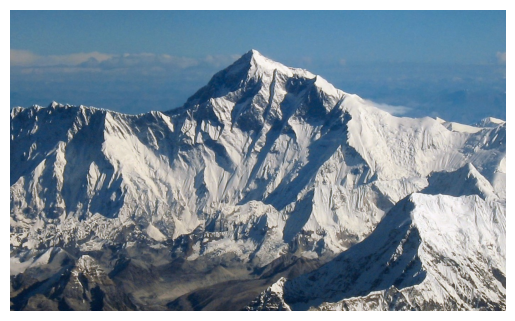

In [56]:
import cv2 as cv
import matplotlib.pyplot as plt
img_MtEverest= cv.imread('/content/Mount_Everest.jpg')
plt.imshow(img_MtEverest[:,:,::-1])
plt.axis("off")
plt.show()

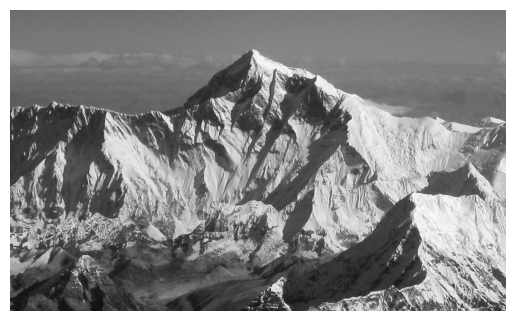

In [57]:
#Add your code here!
operatedImage = cv.cvtColor(img_MtEverest, cv.COLOR_BGR2GRAY)
operatedImage = np.float32(operatedImage)
plt.imshow(operatedImage, cmap='gray')
plt.axis("off")
plt.show()

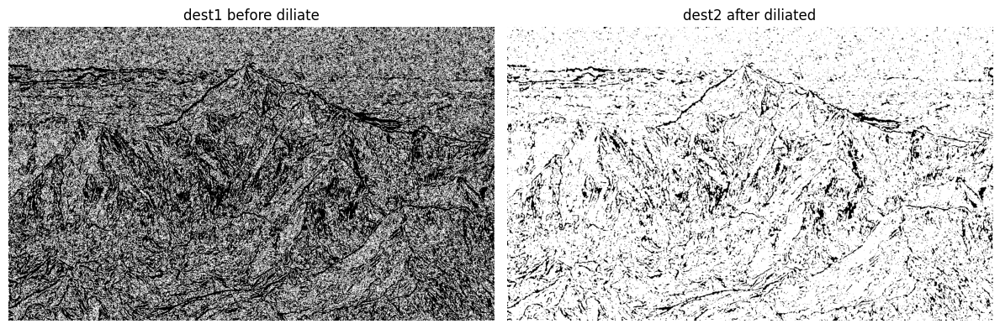

In [61]:
# Apply "the cv2.cornerHarris method"
dst = cv.cornerHarris(operatedImage, blockSize=2, ksize=5, k=0.07) # destination

# Results are marked through the dilated corners (make corner marked position to be bigger)
dst_dilate = cv.dilate(dst, None)

# Visualize the results of dest
plt.figure(figsize=(12, 4))

# results of dest
plt.subplot(1, 2, 1)
plt.imshow(dst, cmap='gray', vmin=0, vmax=1)
plt.title('dest1 before diliate')
plt.axis('off')

# results of dest diliated
plt.subplot(1, 2, 2)
plt.imshow(dst_dilate, cmap='gray', vmin=0, vmax=1)
plt.title('dest2 after diliated')
plt.axis('off')

plt.tight_layout()
plt.show()

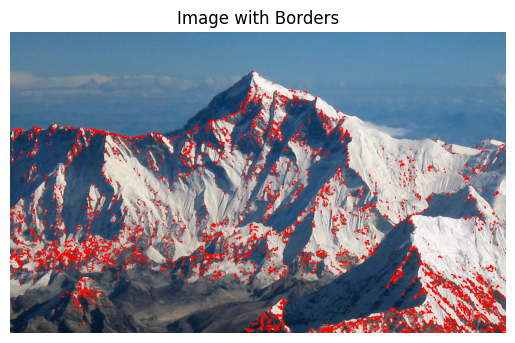

In [62]:
# Reverting back to the original image,
# with optimal threshold value
img_border1 = img_MtEverest.copy()
img_border1[dst_dilate > 0.01 * dst_dilate.max()]=[0, 0, 255] #red color

plt.imshow(img_border1[:,:,::-1])
plt.title("Image with Borders")
plt.axis("off")
plt.show()

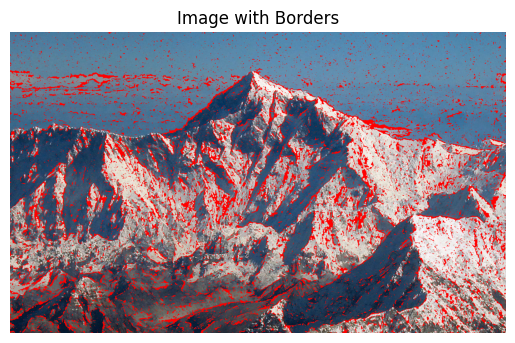

In [63]:
img_border2 = img_MtEverest.copy()
img_border2[dst_dilate < 0 * dst_dilate.max()]=[0, 0, 255]
plt.imshow(img_border2[:,:,::-1])
plt.title("Image with Borders")
plt.axis("off")
plt.show()

##  How different of result when you change input paramters in cv2.cornerHarris() function

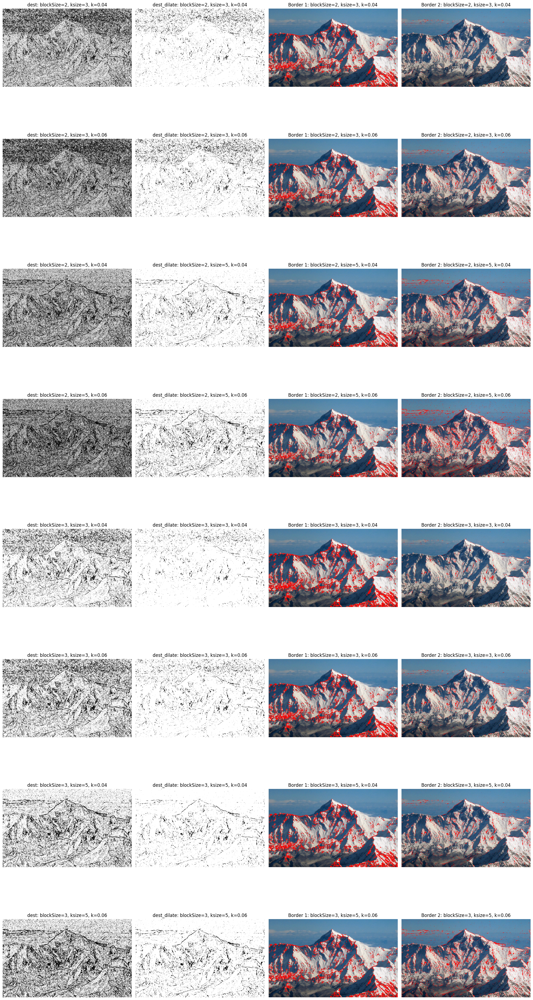

In [69]:
# Define parameter combinations
block_sizes = [2, 3]
ksizes = [3, 5]
k_values = [0.04, 0.06]

# Calculate total number of parameter combinations
total_combinations = len(block_sizes) * len(ksizes) * len(k_values)
num_rows = total_combinations  # Each combination needs one row
num_cols = 4  # Four columns for each type of visualization

# Create a figure with subplots
plt.figure(figsize=(20, 5 * num_rows))
plot_idx = 1

for block_size in block_sizes:
    for ksize in ksizes:
        for k in k_values:
            # Apply Harris Corner Detection
            dst = cv.cornerHarris(operatedImage, blockSize=block_size, ksize=ksize, k=k)

            # Apply dilation
            dst_dilate = cv.dilate(dst, None)

            # Plot original corner detection result
            plt.subplot(num_rows, num_cols, plot_idx)
            plt.imshow(dst, cmap='gray', vmin=0, vmax=1)
            plt.title(f'dest: blockSize={block_size}, ksize={ksize}, k={k}')
            plt.axis('off')

            # Plot dilated result
            plt.subplot(num_rows, num_cols, plot_idx + 1)
            plt.imshow(dst_dilate, cmap='gray', vmin=0, vmax=1)
            plt.title(f'dest_dilate: blockSize={block_size}, ksize={ksize}, k={k}')
            plt.axis('off')

            # Create and plot border image 1
            img_border1 = img_MtEverest.copy()
            img_border1[dst_dilate > 0.01 * dst_dilate.max()] = [0, 0, 255]
            plt.subplot(num_rows, num_cols, plot_idx + 2)
            plt.imshow(img_border1[:,:,::-1])
            plt.title(f'Border 1: blockSize={block_size}, ksize={ksize}, k={k}')
            plt.axis('off')

            # Create and plot border image 2
            img_border2 = img_MtEverest.copy()
            img_border2[dst_dilate < 0 * dst_dilate.max()] = [0, 0, 255]
            plt.subplot(num_rows, num_cols, plot_idx + 3)
            plt.imshow(img_border2[:,:,::-1])
            plt.title(f'Border 2: blockSize={block_size}, ksize={ksize}, k={k}')
            plt.axis('off')

            plot_idx += 4

plt.tight_layout()
plt.show()


# Section 2
Detecting and visualizing keypoints in two images using SIFT
1. Display and compare the keypoints detected in the two images side by side.
2. Observe and write down the exploration of the results

In [71]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [72]:
!gdown "1p8Y4QkM_uXRSV_7hGF9b2CwTgsDoAQZz"

Downloading...
From: https://drive.google.com/uc?id=1p8Y4QkM_uXRSV_7hGF9b2CwTgsDoAQZz
To: /content/Notebook01.jpeg
100% 22.7k/22.7k [00:00<00:00, 41.7MB/s]


In [73]:
!gdown "11tPILvg7f7GY-Nd5r7MckPTYwS3-Mdn5"

Downloading...
From: https://drive.google.com/uc?id=11tPILvg7f7GY-Nd5r7MckPTYwS3-Mdn5
To: /content/Notebook02.jpeg
100% 21.0k/21.0k [00:00<00:00, 43.9MB/s]


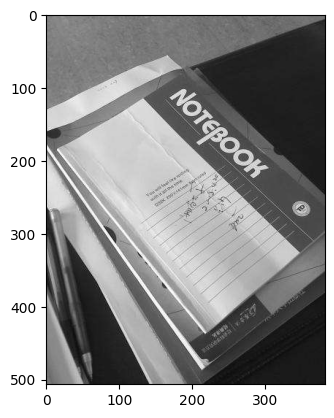

In [74]:
img1 = cv.imread('/content/Notebook01.jpeg')
plt.imshow(img1[:,:,::-1])
plt.show()

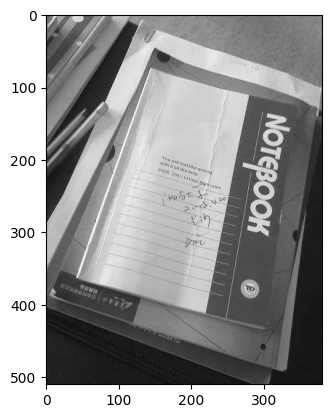

In [75]:
img2 = cv.imread('/content/Notebook02.jpeg')
plt.imshow(img2[:,:,::-1])
plt.show()

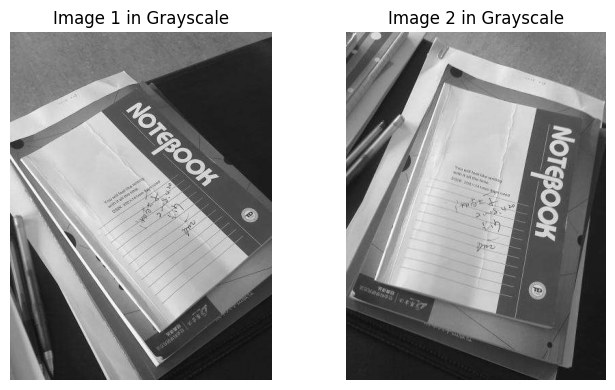

In [77]:
# Answer your code here

gray1= cv.cvtColor(img1,cv.COLOR_BGR2GRAY)
gray2= cv.cvtColor(img2,cv.COLOR_BGR2GRAY)

plt.figure(figsize=(7, 4))

plt.subplot(1, 2, 1)
plt.imshow(gray1, cmap="gray")
plt.title('Image 1 in Grayscale')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gray2, cmap="gray")
plt.title('Image 2 in Grayscale')
plt.axis('off')

plt.tight_layout()
plt.show()

In [78]:
# Create a SIFT object. Using this object, we can perform keypoint detection and feature description computation
sift = cv.SIFT_create()

kp1, des1 = sift.detectAndCompute(gray1,None)
kp2, des2 = sift.detectAndCompute(gray2,None)

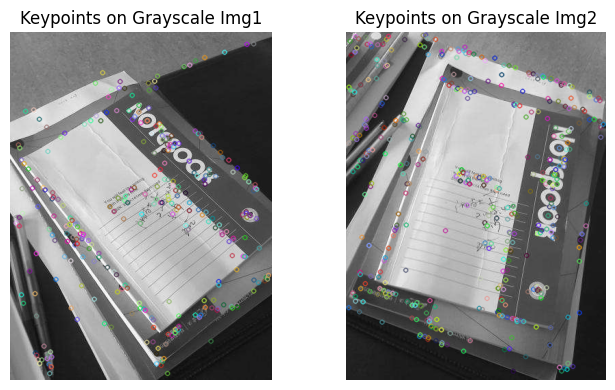

In [79]:
img1_with_keypoints = cv.drawKeypoints(gray1, kp1, None)
img2_with_keypoints = cv.drawKeypoints(gray2, kp2, None)

plt.figure(figsize=(7, 4))

plt.subplot(1, 2, 1)
plt.imshow(img1_with_keypoints, cmap='gray')
plt.title('Keypoints on Grayscale Img1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2_with_keypoints, cmap='gray')
plt.title('Keypoints on Grayscale Img2')
plt.axis('off')

plt.tight_layout()
plt.show()

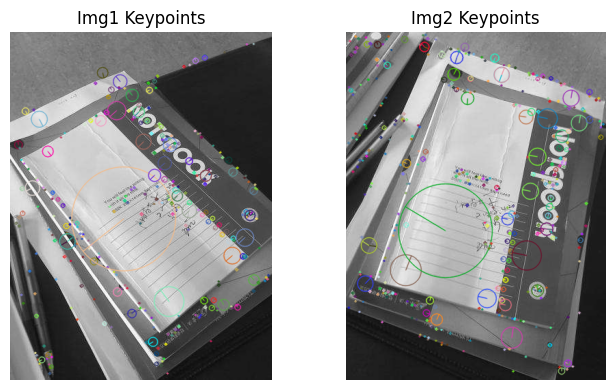

In [80]:
img1_with_keypoints_detail = cv.drawKeypoints(
    img1,# input image
    kp1, # keypoints
    None,# output image，if None, automatically generate new image
    flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

img2_with_keypoints_detail = cv.drawKeypoints(
    img2,# input image
    kp2, # keypoints
    None,# output image，if None, automatically generate new image
    flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

plt.figure(figsize=(7, 4))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img1_with_keypoints_detail, cv.COLOR_BGR2RGB))
plt.title('Img1 Keypoints')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(img2_with_keypoints_detail, cv.COLOR_BGR2RGB))
plt.title('Img2 Keypoints')
plt.axis('off')

plt.tight_layout()
plt.show()

## Observe and write down the exploration of the results

Ans. The images showcase the identified keypoints in two distinct pictures. It is clear that, despite being captured from varying angles or perspectives, these keypoints are still be found in regions with notable detail, such as edges or corners of the object.



---

ภาพเหล่านี้แสดง keypoints ที่ระบุไว้ในภาพสองภาพที่แตกต่างกัน เห็นได้ชัดว่าแม้จะจับภาพจากมุมหรือมุมมองที่แตกต่างกัน แต่ keypoints เหล่านี้ยังคงพบได้ในบริเวณที่มีรายละเอียดที่เห็นได้ชัดในบริเวณที่มีรายละเอียดสูงเช่น ขอบหรือมุมของวัตถุ
